In [3]:
#libraries and necessary packages
#visualization
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import pyLDAvis
import pyLDAvis.sklearn
from IPython import display


#basic
import string
import numpy as np
import pandas as pd
import multidict as multidict

#document processing
from nltk.stem.porter import PorterStemmer
from nltk.corpus import stopwords
import nltk
nltk.download('wordnet')
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import regex as re
import nltk.data
import re
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
from nltk.stem import WordNetLemmatizer
from nltk import word_tokenize, sent_tokenize, pos_tag
from sklearn.feature_extraction.text import CountVectorizer

#folder navigation
import os
import pickle

#sentiment analysis
!pip install text2emotion
import text2emotion as te

#Topic modeling
from sklearn.decomposition import LatentDirichletAllocation
import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/dafnepelagiepapaefthymiou/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/dafnepelagiepapaefthymiou/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/dafnepelagiepapaefthymiou/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


# Story of philosophy: A historical review

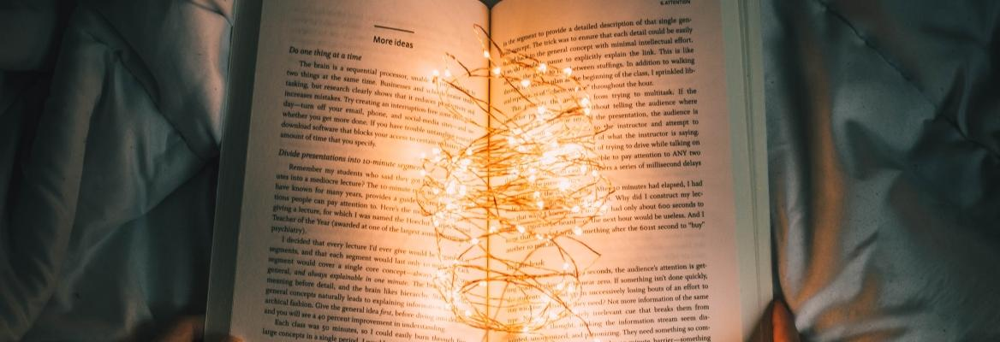

In [4]:
display.Image("./../figs/philosophy.png")

# Introduction

In this blog we are going to talk about the story of philosophy. When were philosophical texts first introduced and how did this science evolved through the years? How do the different philosophical schools influenced each other and do they share common points of interest?

The data used in this analysis were retrieved from The Philosophy Data Project Website http://philosophydata.com/index.html 

In [8]:
dataset_path = '../../../../Downloads/philosophy_data.csv'
dataset = pd.read_csv(dataset_path , low_memory=False)

# Data exploration


In [9]:
#exploration of number of different books, schools, and timeline of publications
df_book =  dataset.groupby(['title']).size().reset_index(name='counts')#to get df instead of series
df_school_title =  dataset.groupby(['school','title']).size().reset_index(name='counts')
df_school = dataset.groupby(['school']).size().reset_index(name='counts')
df_timeline =  dataset.groupby(['title','original_publication_date','school']).size().reset_index(name='counts')#to get df instead of series
df_timeline.sort_values(by=['original_publication_date'])

,title,original_publication_date,school,counts
40,Plato - Complete Works,-350,plato,38366
4,Aristotle - Complete Works,-320,aristotle,48779
48,The Book of Zhuangzi,-300,Daoism,5870
31,On Anger,45,stoicism,477
34,On Clemency,55,stoicism,481
...,...,...,...,...
29,Naming And Necessity,1972,analytic,2681
3,Anti-Oedipus,1972,continental,6679
39,Philosophical Troubles,1975,analytic,9798
67,"Women, Race, And Class",1981,feminism,5916


The data that we have indicate that the first philosophical texts go back to the 350 BC. That was an era of wealth and prosperity for the greek and chineese civilizations and so, since  livelihoods and the sustainability of life were secured, there were favorable conditions for contemplation, education or research. The era of roman empire seems also favorable. Publications of philosophical texts are reduced dramatically during the period from 500 - 1500. This in known as The Middle Ages, an era which is caracterized by population decline, counterurbanisation, the collapse of centralized authority, invasions, and mass migrations of tribes. No wonder why people stopped being preoccupied by philosophy. Philosophical texts made their appearence again around the 1700s a period which is highly associated to the Renaissance and the french revolution. Since then, people have being studying philosophy systematically. An interesting observation is that philosophy schools succeed one another. That means that as the world evolves, as we gain more knowledge about our own existence our thinking evolves and we develop new theories and practices.

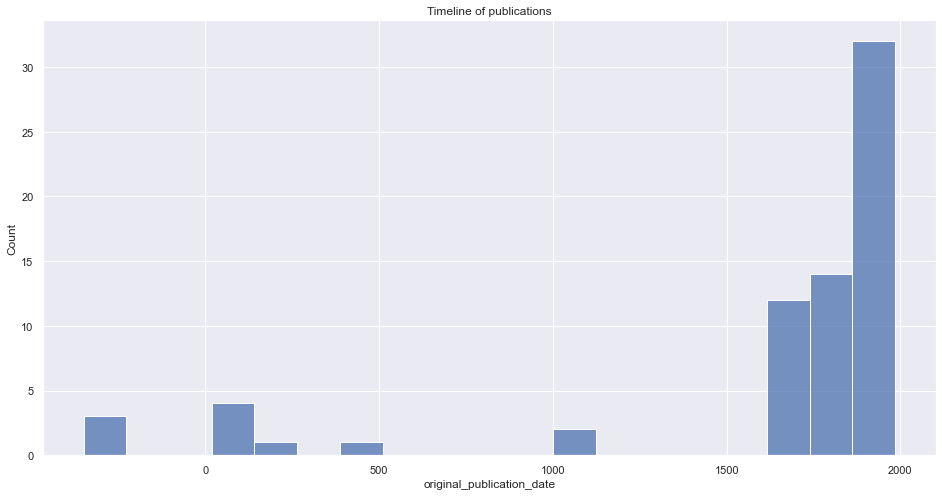

In [10]:
# set a grey background (use sns.set_theme() if seaborn version 0.11.0 or above) 
#observe the timeline of publications
sns.set(style="darkgrid")
sns.set(rc = {'figure.figsize':(16,8)})
sns.histplot(data=df_timeline, x="original_publication_date" )
plt.title('Timeline of publications')
plt.show()


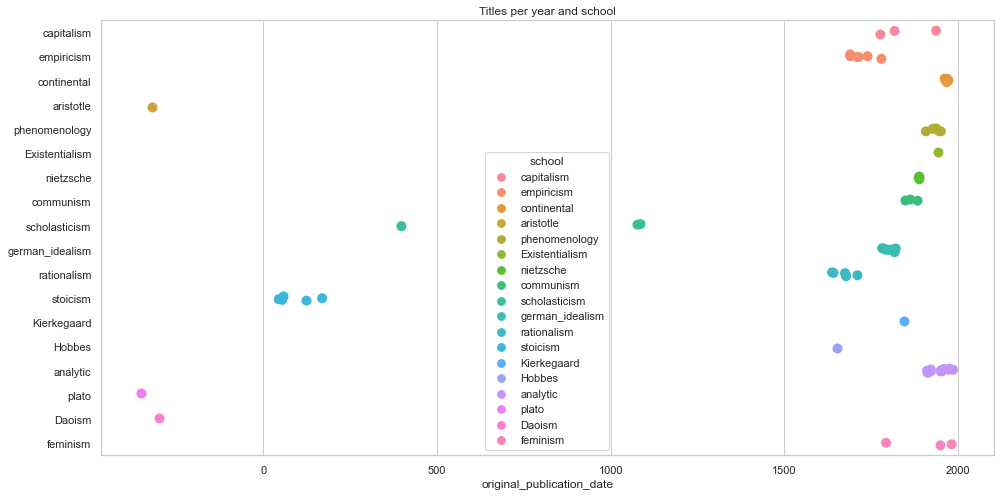

In [11]:
#Timeline of publications per school
sns.set_theme(style="whitegrid", palette="muted")
ax = sns.stripplot(data=df_timeline,
    x= "original_publication_date", y="school", hue="school" , s=10)
ax.set(ylabel="")
plt.title('Titles per year and school')
plt.savefig('Titles per year and school.png')
plt.show()

Let's have a look at the volume of publications. In total our dataset contains 69 different books and for no school we have available more than 11 books. In fact, some schools are represented mostly from one book/author. This seems logical since some scholls actually refer to a theory perceived and described by a single writer (for example plato, nietzhe, etc)

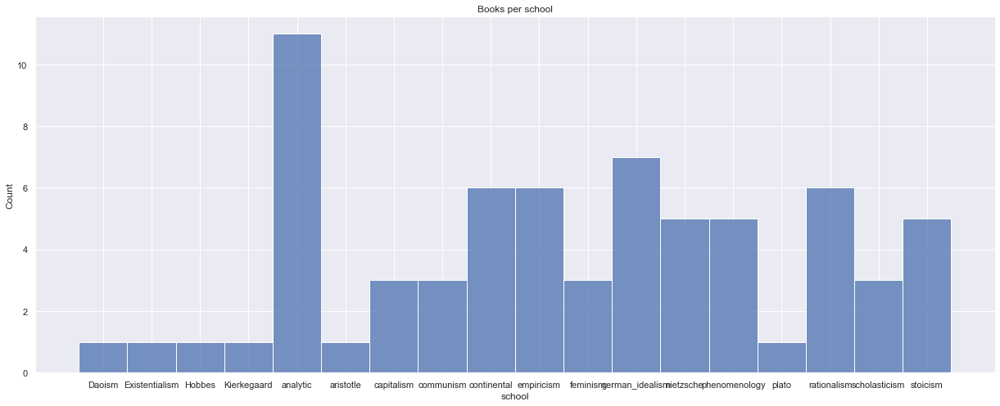

In [12]:
sns.set(style="darkgrid")
sns.set(rc = {'figure.figsize':(21,8)})
sns.histplot(data=df_school_title, x="school" )
plt.title('Books per school')
plt.show()

How did the presentation of ideas changed during the times? Let's have a look at the sentence lengths for each school. A sentence is the building block of language, which in turn allowes us to express our thoughts and emotions. Below we can see the average sentence length per school. The size of the bullets indicates the amount of sentences we have in our dataset for each school. It is difficul to retrieve a general pattern for the sentence lengths but it seems as if, initially, philosophers tended to use smaller sentences in order to express their thoughts. As time passed, these sentences became more large and complex. The past decates people have come to appreciate the beauty of simplicity and laconism and therefore smaller sentences appear once again. This hypothesis is challenged by the existance of two outliers, namely schools of aristotle and continantal.

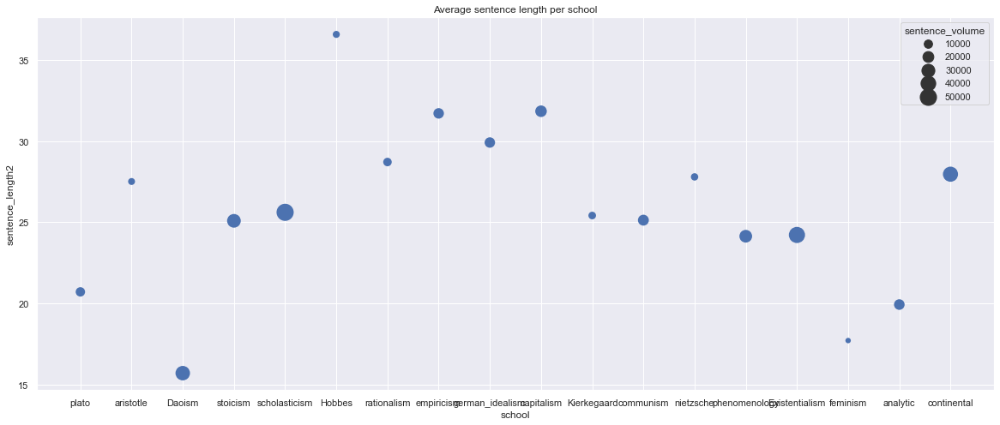

In [13]:
#sentence length visualization, we create our own sentence_length2 column since we discovered that the initial dataset column is inconsistent
dataset['sentence_length2'] = dataset['tokenized_txt'].apply(lambda sentence_str: len(sentence_str.split()))
dataset_sorted = dataset.sort_values(by=['original_publication_date'])
#fing avg sentence length per school
mean_df = dataset_sorted.groupby("school")['sentence_length2' , 'original_publication_date' ].mean()
mean_df = mean_df.reset_index()
#sort chronologically
mean_df = mean_df.sort_values(by=['original_publication_date'])
#sort the dataframe that contains information about the amount of sentences per school also chronologically
df_school = df_school.set_index('school')
df_school = df_school.reindex(index=mean_df['school'])
df_school = df_school.reset_index()
#add to our mean dataset the amount of sentences per school
mean_df['sentence_volume'] = df_school['counts']
#plot
sns.set(style="darkgrid")
sns.set(rc = {'figure.figsize':(20,8)})
mean_df
sns.scatterplot(y=mean_df['sentence_length2'], x=mean_df['school'],
                palette="ch:r=-.2,d=.3_r",
                sizes=(40, 400), linewidth=0 , size = mean_df['sentence_volume']  )
plt.title('Average sentence length per school')
plt.savefig('Average sentence length per school.png')
plt.show()
chronological_order = mean_df['school'].values.tolist()

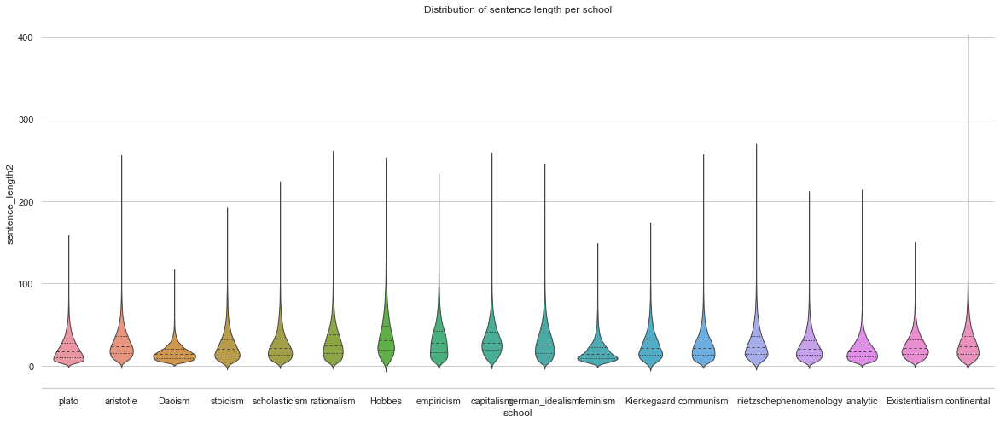

In [14]:
#plot violionplots to investigate sentence length distributions
sns.set_theme(style="whitegrid")
sns.violinplot(data=dataset_sorted, y=dataset_sorted['sentence_length2'], x=dataset_sorted['school'], 
               split=False, inner="quart", linewidth=1)
sns.despine(left=True)
plt.title('Distribution of sentence length per school')
plt.savefig('Sentence_length_distrib.png')
plt.show()

The violin plots are more informative about the distributions of sentence lengths. For example we can see that in the continental school there exist a few sentences with a very high amount of worlds which highly biases the mean of the distribution.

In general sentences seem to be larger than the usual sentence length in all cases. We therefore proceeded to investigate the existence of other symbols of punctiation that could explain the size of sentences. The following plot is investigating the existence of ',' and ';' symbols. It is consistent with our sentence length analysis in the sense that the schools that seem to have sentences with the greater lengths are also those which contain the greater amount of punctiation symbols.

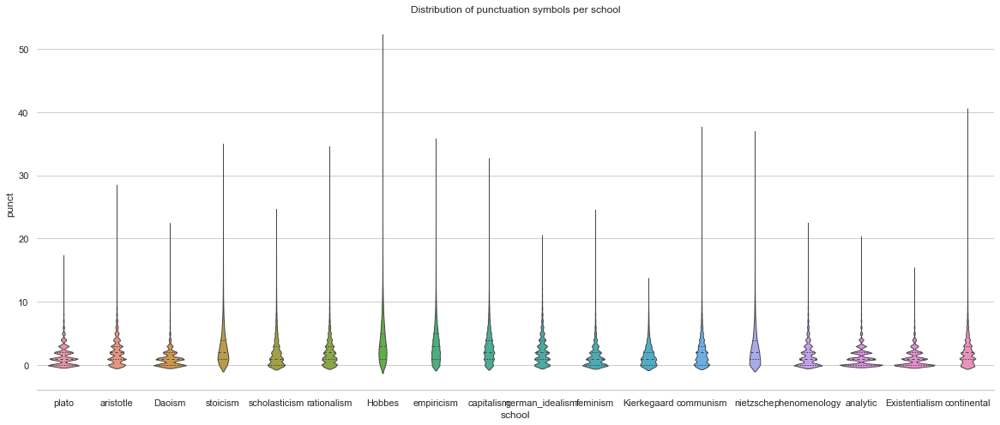

In [15]:
#punctuation symbol count in each sentence
dataset['commas'] = dataset['sentence_str'].apply(lambda x: x.count(','))
dataset['quest'] = dataset['sentence_str'].apply(lambda x: x.count(';'))
dataset['punct'] = dataset['commas'] + dataset['quest']
dataset_sorted2 = dataset.sort_values(by=['original_publication_date'])
#plot
sns.set_theme(style="whitegrid")
sns.violinplot(data=dataset_sorted2, y=dataset_sorted2['punct'], x=dataset_sorted2['school'], 
               split=False, inner="quart", linewidth=1)
sns.despine(left=True)
plt.title('Distribution of punctuation symbols per school')
plt.savefig('punctuation_distrib.png')
plt.show()

# Data processing

We applied a pipeline of text preprocessing steps using <b>nltk</b> library. Specifically we used the following techniques:
  - Removal of numbers from sentences
  - Removal of punctuation symbols
  - Conversion of upper case letters to lower case
  - Removal of redundant white space characters
  - Removal of english stop words as well as word lemmatization in order to reduce inflectional forms of a world to a common base form 


In [11]:
#pipeline for preprocessing the sentences each function is named appropriately and is defined separately 
def preprocess_text(text):
    text = remove_numbers(text)
    text = remove_punctuation(text)
    text = convert_to_lower(text)
    text = remove_white_space(text)
    trans_table={ord(c):None for c in string.punctuation+string.digits}
    text = tokenize(text, trans_table)
    return text

def convert_to_lower(text):
  return text.lower()

def remove_numbers(text):
  text = re.sub(r'\d+' , '', text)
  return text

def remove_punctuation(text):
     punctuations = '''!()[]{};«№»:'"\,`<>./?@=#$-(%^)+&[*_]~'''
     no_punct = "" 
     for char in text:
        if char not in punctuations:
            no_punct = no_punct + char
     return no_punct

def remove_white_space(text):
  text = text.strip()
  return text

def tokenize(text, trans_table):
#we remove stop words both before and after lemmatization
    english_stemmer = PorterStemmer()
    text = text.lower()
    stops = stopwords.words('english')
    #additional stop words that we removed
    stops.extend(['go','sure','back','say','one','two','say','would','us', 'also' ,'dont' , 'another'                                                                                            
    'without','much','whose','therefor','first','within','yet','this', 'thing' , 'though' , 'may','often'])
    stop_words = set(stops)
    tokens= [world for world in nltk.word_tokenize(text.translate(trans_table)) if len(world)>1]
    tokens = [i for i in tokens if not i in stop_words]
    #lemmatizing words
    pos_map = {'J': 'a', 'N': 'n', 'R': 'r', 'V': 'v'}
    pos_tags_list = pos_tag(tokens)
    lemmatiser = WordNetLemmatizer()
    tokens = [lemmatiser.lemmatize(w.lower(), pos=pos_map.get(p[0], 'v')) for w, p in pos_tags_list]
    #again removal of stop words in the lemmatised text
    result = [i for i in tokens if not i in stop_words]
    return result

In [12]:
#apply preprocessing to the whole sentence_str column
dataset['sentence_cleaned2'] = dataset['sentence_str'].apply(lambda x: ' '.join(preprocess_text(x)))

# WordClouds

Let us know have a look at the concepts introduced by each school. Below we can see the worldclouds, presenting the most used words for every school. In order to extract those, common english words, such as and,the,of, are excluded. We manually removed some other words that occured oftenly and did not seem to benefit our analysis.

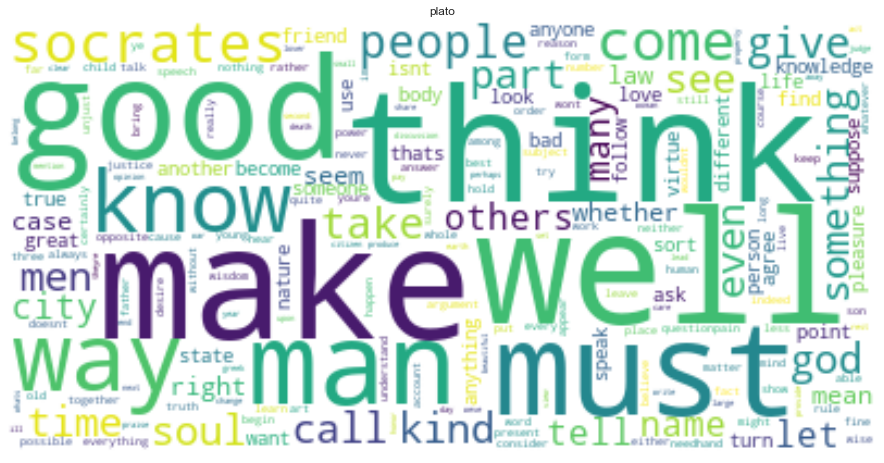

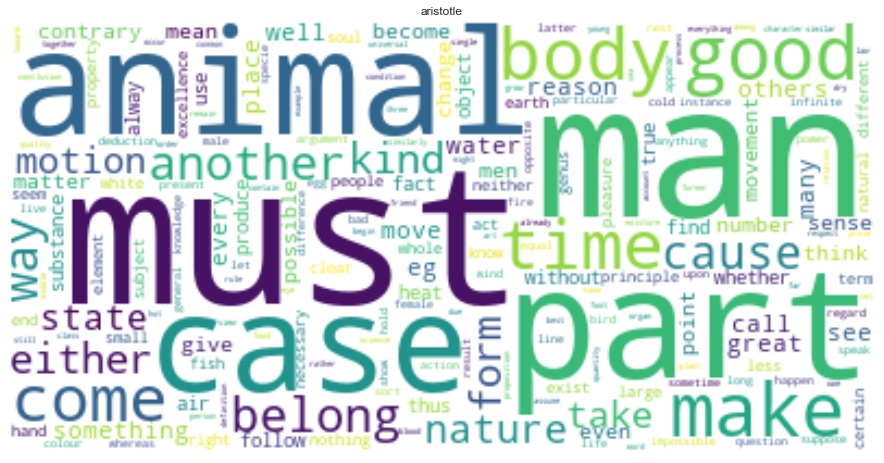

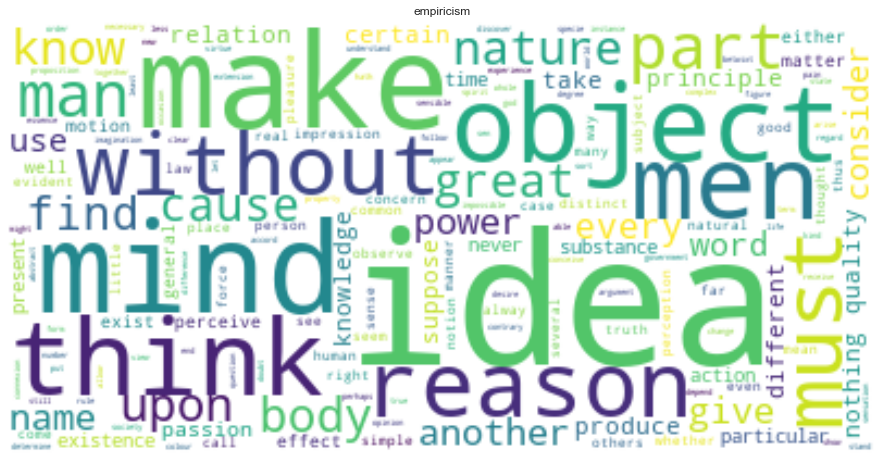

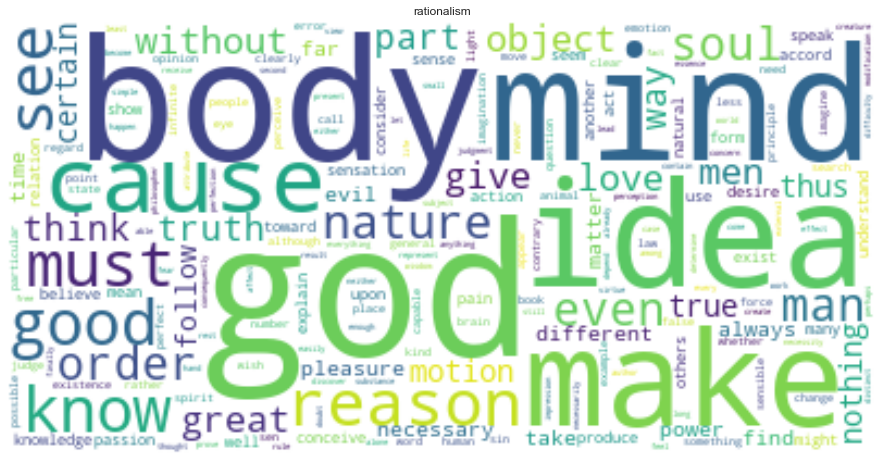

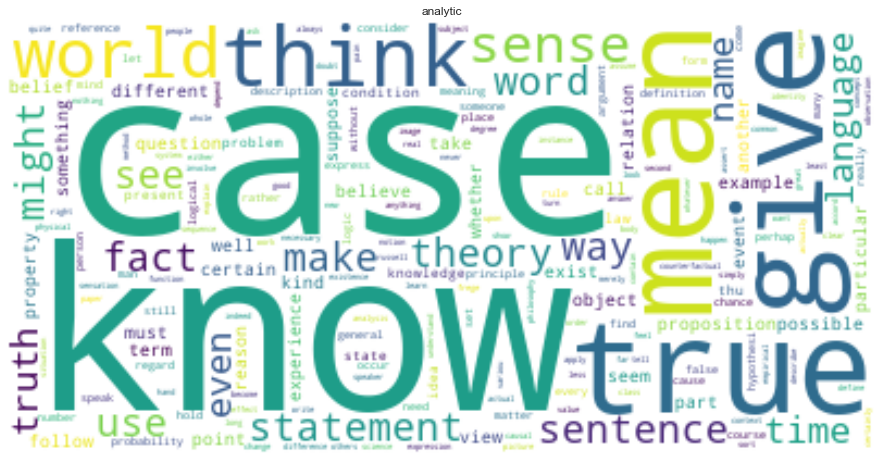

...

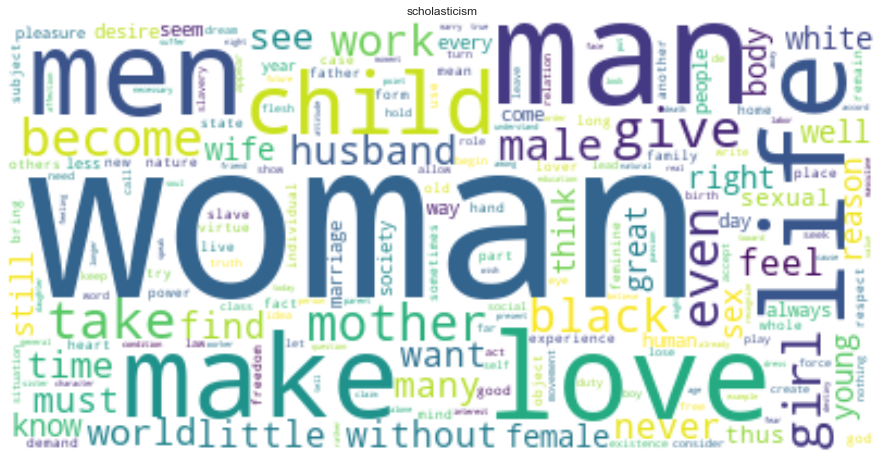

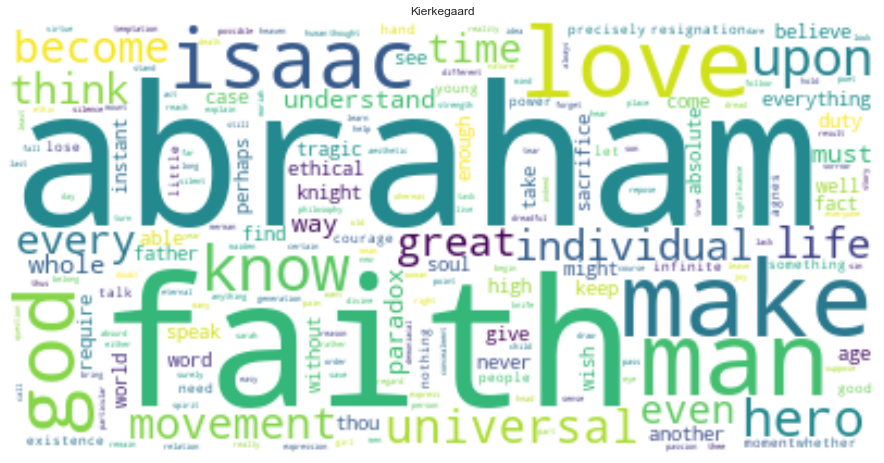

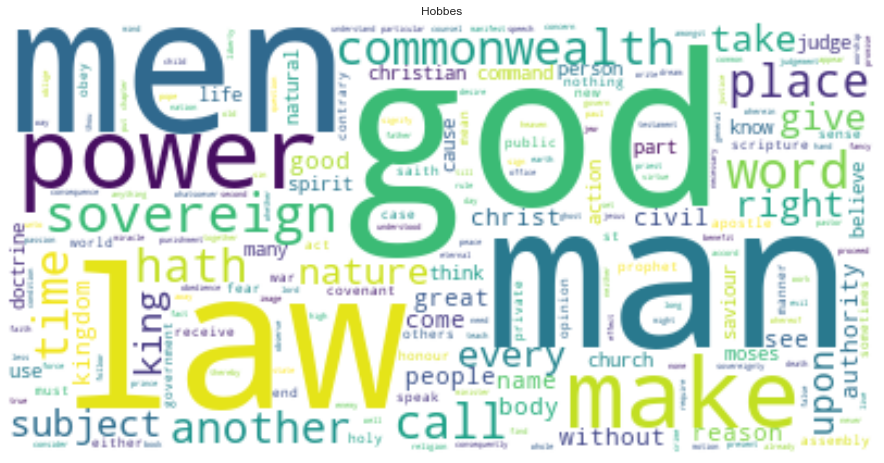

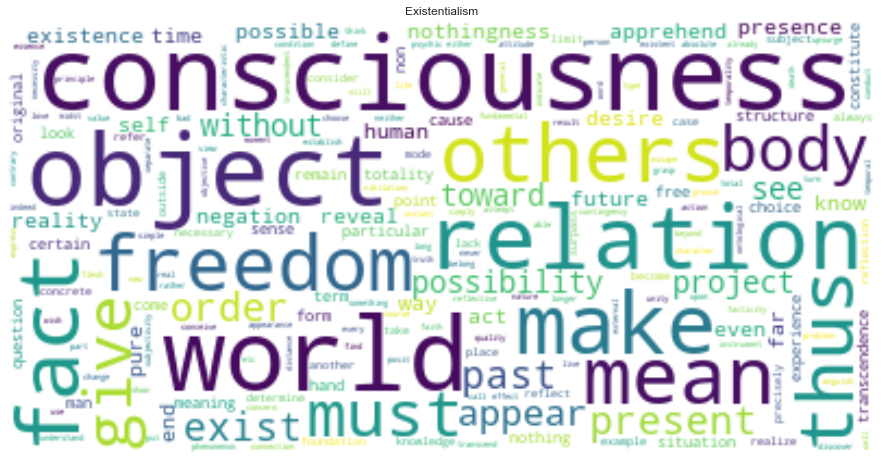

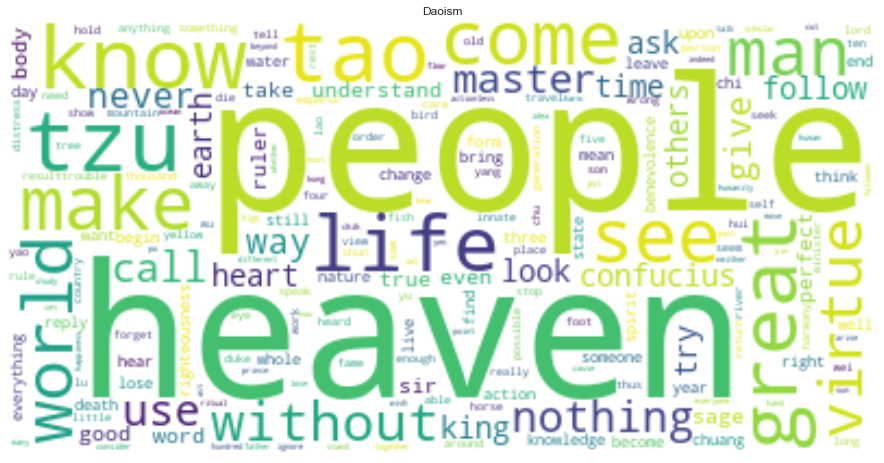

In [14]:
#display word clouds that show the main themes for each school based on term frequency
schools = dataset["school"].unique()
for school in schools:
    df_school = dataset[(dataset.school==school)]
    text = ' '.join(df_school['sentence_cleaned2'])
    word_cloud = WordCloud(collocations = False, background_color = 'white').generate(text)
    plt.imshow(word_cloud, interpolation='bilinear')
    plt.axis("off")
    fig = plt.figure(1, figsize=(0.25, 0.25))
    plt.title(school)
    plt.savefig(school+'png')
    plt.show()
    fullTermsDict = multidict.MultiDict()
    tmpDict = {}
    


We can get a nice feeling about the evolution of philosophy through these plots. Starting from BC, the main topics of interest were simple contemplations about life (we see worlds like life, man , think), and also raised questions about our surroundings, the things that constitute the world around us (animals, world, heaven). It seems as if the greek philosophers did not touch the topic of god as much, but this idea is particularly apparent in the worldcloud created for Daoism. On the contrast, greeks were highly interested in the consitution of societies and thus they talk about laws,kings,archons. 

Moving on we again see simple ideas being discussed such as the gods, the good and the bad(stohisism), the constitution of family and the relashionships of men and women(Scholasticism).  After 1700AC, topics refering to the human existance, as a union of a thinking mind and a functional body make their appearence (rationalism,empiricism). 

As we reach later years, more complex concepts start to emerge. Philosophers are talking about critique,phenomenology, concept, conciousness and even references to science are emerging. Nevertheless, the past century was a significant era for humanity since we went through two world wars, major industrial and scientific revolutions and experienced a remarkable progress in evey domain of our everyday lifes. All that seem to have been food for thought for all recent philosophers. We also discover specific words highly related to associated schools such as labour,growth,value,society, which appear in two almost opposite topics, capitalism and communism. 

# Topic Modeling using LDA


We will now investigate if there exist parralels in the different philosophical schools. Note that as seen in previous figures,the time periods in which each we have publications for each school are well defined in the sense that after a relatively small amount of time since the emergence of each school relevant publications stop to occur. But does this mean that the topics that each school examined are distinct? Can we perhaps observe a sort of evolution of the presented ideas? Topic modeling could help us answer such questions. Specifically, we will try to generate 6 different clusters (1/3 of the initial schools) from the available books and investigate how they correlate to each other. The most occured words for the created topics are plotted below.

In [15]:
#we are going to concatenate the sentences in order to reconstruct the original books 
titles = dataset["title"].unique()
df = pd.DataFrame()
dic   = {}
for title in titles:
    df_title = dataset[(dataset.title==title)]
    text = ' '.join(df_title['sentence_cleaned2'])
    dic[title] = [text]
data = pd.DataFrame(data=dic)
#each row of our new dataset d is a book content indexed by the book name
d  = data.T

In [16]:
dataLDA = d[0].values.tolist()
st = stopwords.words('english')
st.append('must')
st.append('therefore')
st.append('could')
st.append('another')
vectorizer = CountVectorizer(strip_accents = 'unicode',
                                stop_words = st,
                                lowercase = True)
dtm_tf = vectorizer.fit_transform(dataLDA)
#experiment with different number of clusters
num_components=6
model=LatentDirichletAllocation(n_components=num_components, random_state=1)
lda_matrix = model.fit(dtm_tf)
lda_components=model.components_

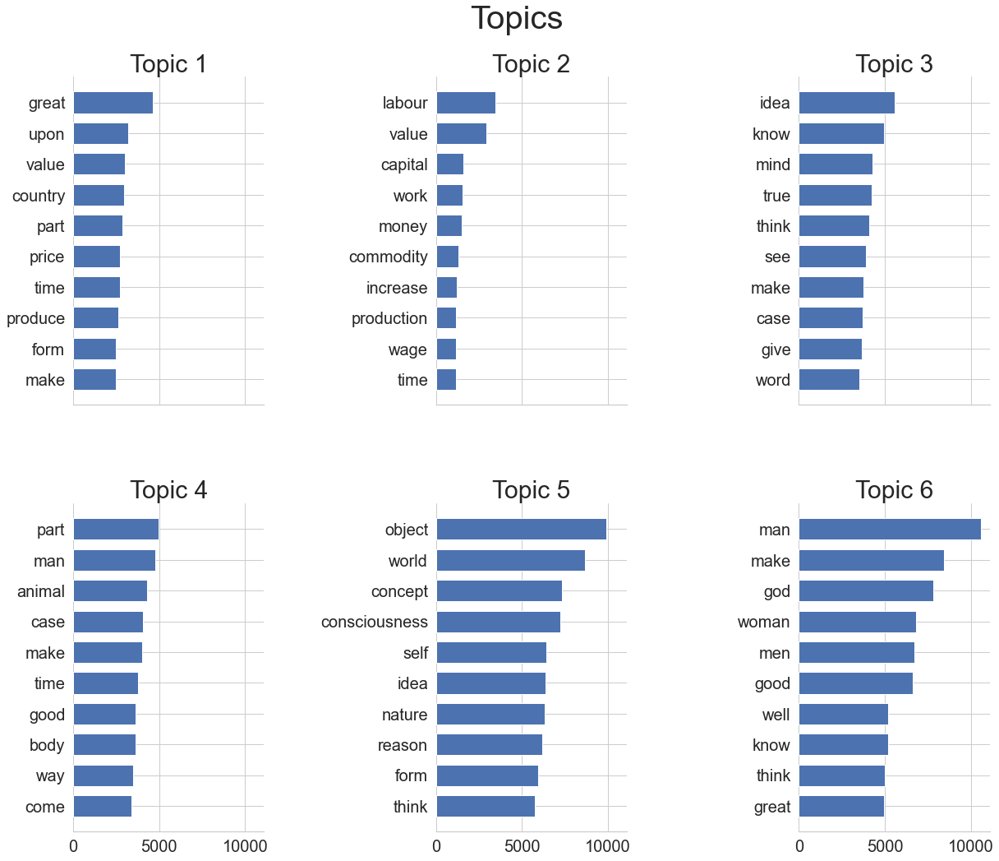

In [17]:
#visualization of outputs. Source: https://towardsdatascience.com/introduction-to-topic-modeling-using-scikit-learn-4c3f3290f5b9
def plot_top_words2(model, feature_names, n_top_words, title):
    fig, axes = plt.subplots(2, 3, figsize=(20, 15), sharex=True)
    axes = axes.flatten()
    for topic_idx, topic in enumerate(model.components_):
        top_features_ind = topic.argsort()[: -n_top_words - 1 : -1]
        top_features = [feature_names[i] for i in top_features_ind]
        weights = topic[top_features_ind]
        ax = axes[topic_idx]
        ax.barh(top_features, weights, height=0.7)
        ax.set_title(f"Topic {topic_idx +1}", fontdict={"fontsize": 30})
        ax.invert_yaxis()
        ax.tick_params(axis="both", which="major", labelsize=20)
        for i in "top right left".split():
            ax.spines[i].set_visible(False)
        fig.suptitle(title, fontsize=40)
    
    plt.subplots_adjust(top=0.90, bottom=0.05, wspace=0.90, hspace=0.3)
    plt.savefig('LDA topics')
    plt.show()
tf_feature_names = vectorizer.get_feature_names()
plot_top_words2(model, tf_feature_names, 10, "Topics")

We immediatley see that the created clusters include words that are very representative of specific topics. For example, texts included in Topic 5 are mostly 'genetated' by worlds such as capital, labour, woman. We immediately see that texts refering to communism or capitalism must have a high probability to be mostly classified in this topic (we use the word mostly as LDA performs a sort of soft assignment of documents to topics). Another observation is that the plot is consistent with the hypothesis that the different schools share common themes. We can see how different topics share common words in the figure above. We now perform the following vizualization that allowes us to:
Manually select each topic to view its top most frequent and/or “relevant” terms, using different values of the λ parameter. This can help whith assigning a human interpretable name or “meaning” to each topic.
Explore the Intertopic Distance Plot.This can help to learn about how topics relate to each other, including potential higher-level structure between groups of topics. This shown a transformation for dimentionality reduction and uses only the first 2  components.


In [25]:
#2nd Visualization technique, interactive
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('./Documents/Github/spring-2022-prj1-dafnep/output/topics'+str(6))
# # this is a bit time consuming - make the if statement True
# # if you want to execute visualization prep yourself
if 1 == 1:
    LDAvis_prepared=pyLDAvis.sklearn.prepare(model, dtm_tf, vectorizer, mds='tsne')
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, './Documents/Github/spring-2022-prj1-dafnep/output/topics'+ str(6) +'.html')
LDAvis_prepared

PreparedData(topic_coordinates=               x          y  topics  cluster       Freq
topic                                                  
4       1.465019 -47.625065       1        1  25.954418
5      54.854797 -36.476795       2        1  24.438800
2      32.212929 -61.444572       3        1  15.706937
3       5.111096 -14.110332       4        1  15.311541
0      26.350170 -33.374702       5        1  14.079325
1      38.109818  -7.222781       6        1   4.508980, topic_info=                Term          Freq         Total Category  logprob  loglift
82954          value   7642.000000   7642.000000  Default  30.0000  30.0000
42076         labour   5439.000000   5439.000000  Default  29.0000  29.0000
14713  consciousness   7242.000000   7242.000000  Default  28.0000  28.0000
35554           idea  12991.000000  12991.000000  Default  27.0000  27.0000
10432        capital   3486.000000   3486.000000  Default  26.0000  26.0000
...              ...           ...           ...      ...      ...      ...
62400       quantity    616.306631   3229.369430   Topic6  -5.7848   1.4428
31250           give    835.539090  17710.340647   Topic6  -5.4804   0.0453
46710           mean    773.787422  14927.115906   Topic6  -5.5572   0.1395
32771           hand    626.129235   7074.639737   Topic6  -5.7689   0.6744
45693           make    652.024276  24613.398175   Topic6  -5.7284  -0.5319

[577 rows x 6 columns], token_table=       Topic      Freq         Term
term                               
212        2  0.961901      abraham
212        3  0.006088      abraham
212        5  0.009132      abraham
212        6  0.024352      abraham
279        1  0.821014     absolute
...      ...       ...          ...
86831      6  0.948390           yw
86861      2  0.944095  zarathustra
86861      5  0.001545  zarathustra
86861      6  0.052536  zarathustra
87157      6  0.950649           αn

[1733 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 6, 3, 4, 1, 2])

The two previous visualizations give different assignments to topic names. We are going to state the equivalance of topics in the two cases which can be identified by inspecting the most used worlds.


| Figure:Topics | Figure: 2nd visualization |
| --- | --- |
| Topic 1 | Topic 5 |
| Topic 2 | Topic 6 |
| Topic 3 | Topic 3 |
| Topic 4 | Topic 4 |
| Topic 5 | Topic 1 |
| Topic 6 | Topic 2 |

Using the visualizations, we can try to assign names to the topics using the first figure's labeling .
- Topic 1: Modern Nations
- Topic 2: Economic systems and Working class
- Topic 3: Thinking and human mind used in efforts to explain the world
- Topic 4: Humans and Nature
- Topic 5: Consciousness and existational questions
- Topic 6: Human relashionships and scocieties

In [19]:
#lets cluster the documents to most relevant topics
dic = dict(zip(dataset.title, dataset.school))
schools_for_each_pub = pd.DataFrame.from_dict(dic, orient='index')
doc_topic = model.transform(dtm_tf)
cluster = []
for n in range(doc_topic.shape[0]):
    topic_most_pr = doc_topic[n].argmax()
    cluster.append(topic_most_pr)
schools_for_each_pub['topic'] = cluster
schools_for_each_topic =  schools_for_each_pub.groupby(['topic',0]).size().reset_index(name='counts')


We now proceed to overview the assignment of documents to topics. In the following picture we can see the amount (counts) of books of each school that have been clustered to each topic. The results depict the beauty of philosophical thinking evolution! Observe how plato and daoism, two of the most ancient philosophical schools share common themes with nietzsche feminism and kierkegaard. That is indictive of how ideas and concepts are being shaped throughout the years. They do not emerge and later on disappear. Instead they are processed, examined, transformed and give rise to more recent philosophy schools. We also see how in 5 cases, different books of a specific school are assigned to different clusters. There are no limits in human thinking and strictly separating lines could not exist between different topics. 

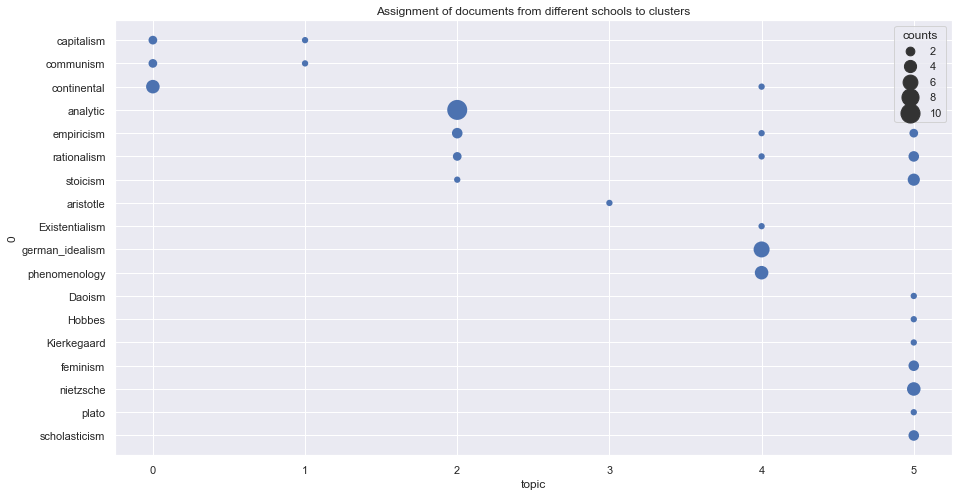

In [20]:
#plot
sns.set(rc = {'figure.figsize':(15,8)})
mean_df
sns.scatterplot(y=schools_for_each_topic[0], x=schools_for_each_topic['topic'],
                palette="ch:r=-.2,d=.3_r",
                sizes=(40, 400), linewidth=0 , size = schools_for_each_topic['counts']  )
plt.title('Assignment of documents from different schools to clusters')
plt.savefig('Assignment of documents  to clusters.png')
plt.show()


As for the performance of our clustering we can confirm that the results were very satisfactory. Communism, Capitalism and continental texts are assigned to first two clusters. These schools refer to similar concepts and the words assigned to the first two topics characterize them completely. Most of the schools that are represented in the third one also appear in the last one. These two clusters refer to topics 2,3 from the 2nd visualization figure, which as we can see in the figure are relatively close.
One last observation is that the idiomorphism of the language used by aristortle and the fact that he considers nature, animals, human bodies are among the reasons why he is clustered in a separate topic.

# Sentiment Analysis 

Finally, we  investigate how the attitude of the philosophers towards important concepts, which we retrieved through the previous method, has changed in each different school. In order to do so, we first filter the sentences of the dataset in order to only keep sentences that contain important words which we identified in our previous analysis. tHE worlds we focus on are <b>'god', 'labour','philosophy','woman','concept','think','idea','world'</b>. Then, do a sentiment analysis assigning values to 5 different emotions for each sentence. The emotions that we are interested in are <b>Happy, Fear, Angry, Surprise and Sad </b>. These values are then averaged among different schools and the results are presented below. For each school, we can see what sentiments are more dominant is sentences that contain the relative worlds.

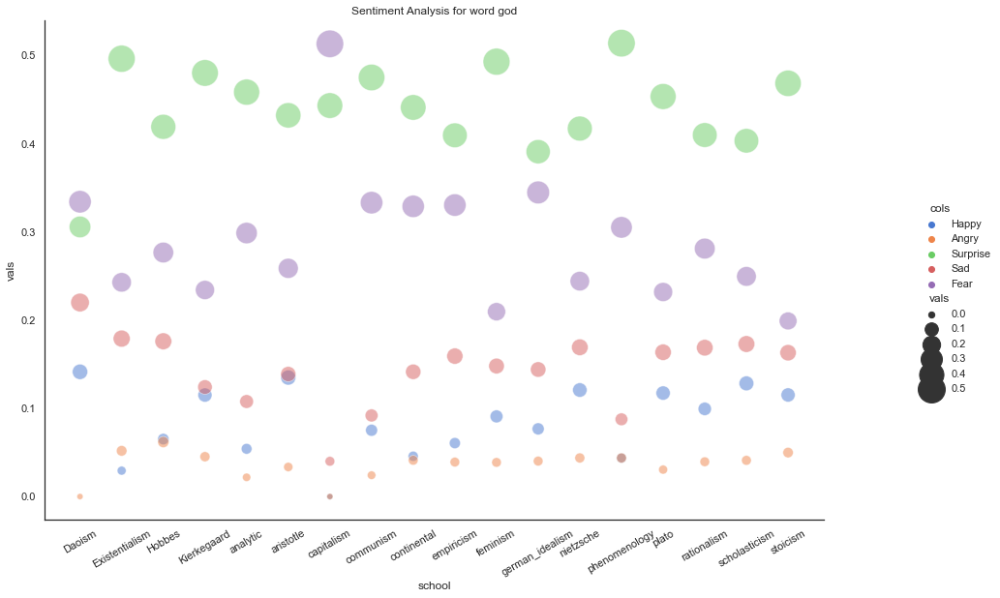

<Figure size 1080x576 with 0 Axes>

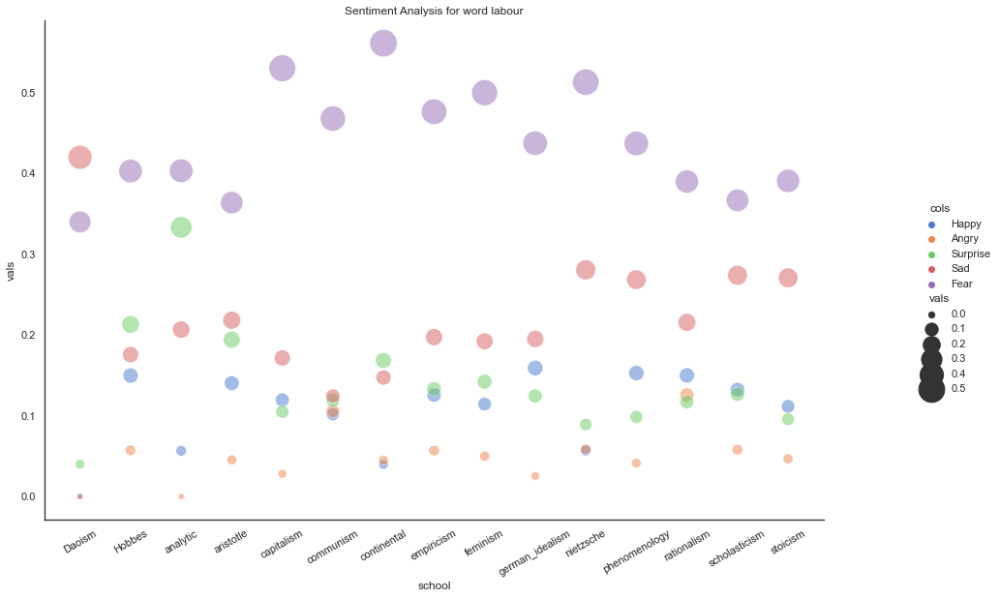

<Figure size 1080x576 with 0 Axes>

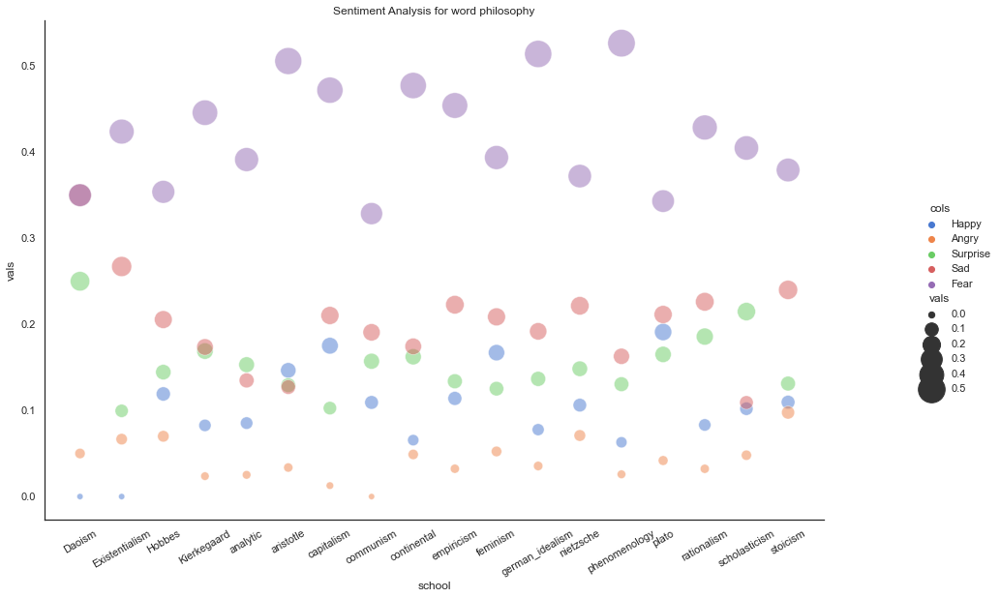

<Figure size 1080x576 with 0 Axes>

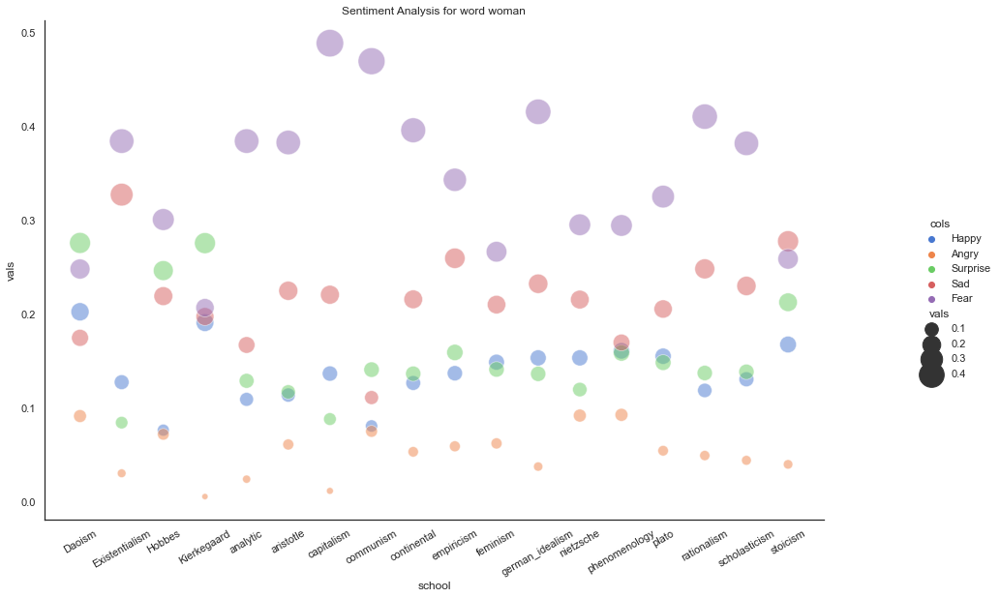

<Figure size 1080x576 with 0 Axes>

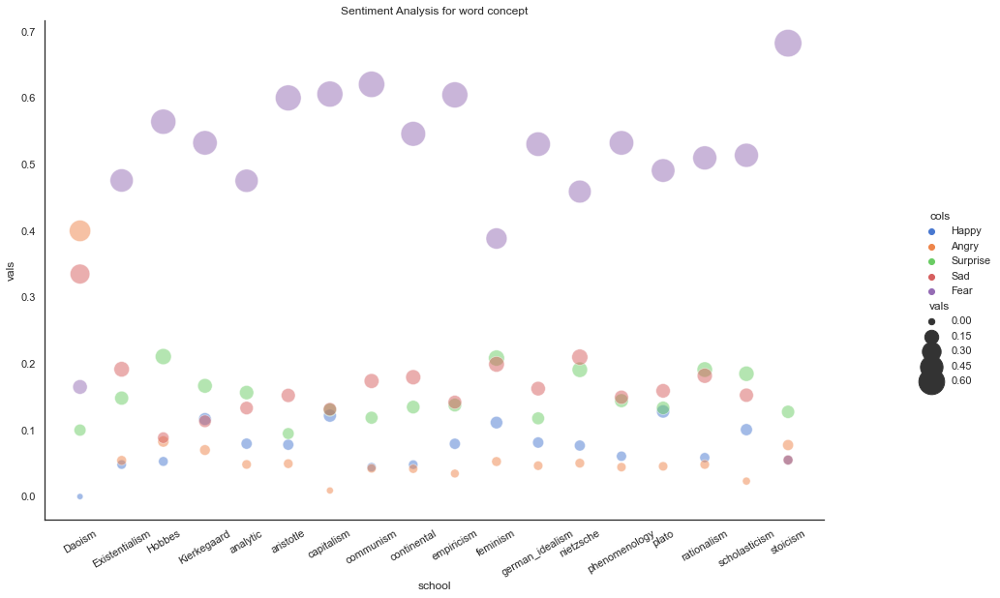

<Figure size 1080x576 with 0 Axes>

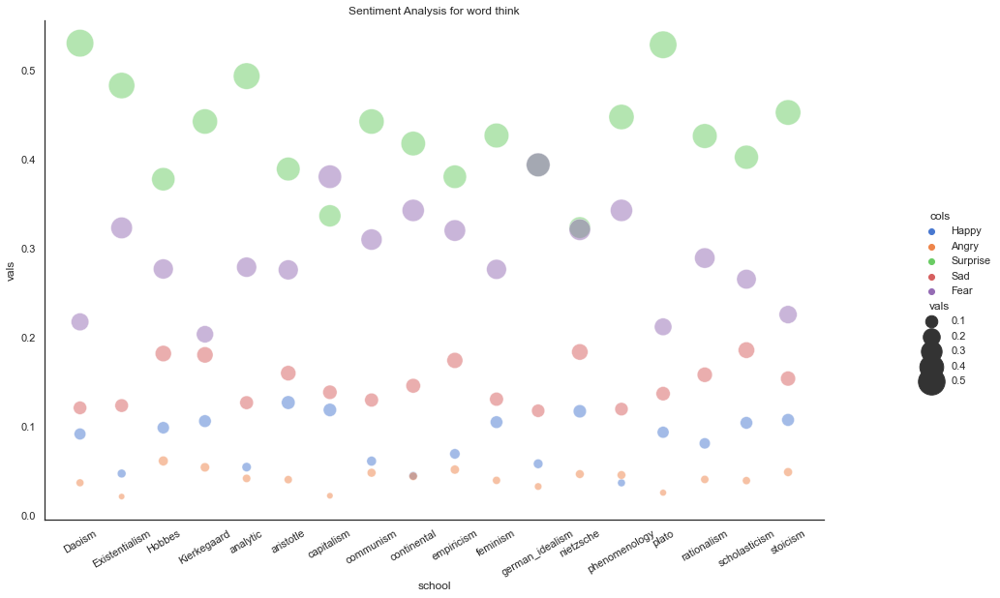

<Figure size 1080x576 with 0 Axes>

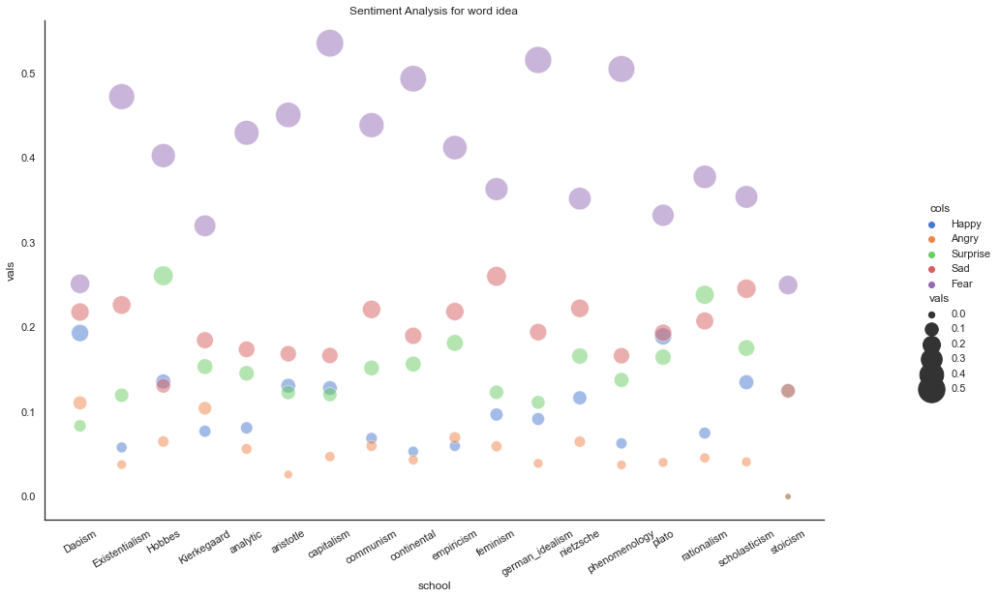

<Figure size 1080x576 with 0 Axes>

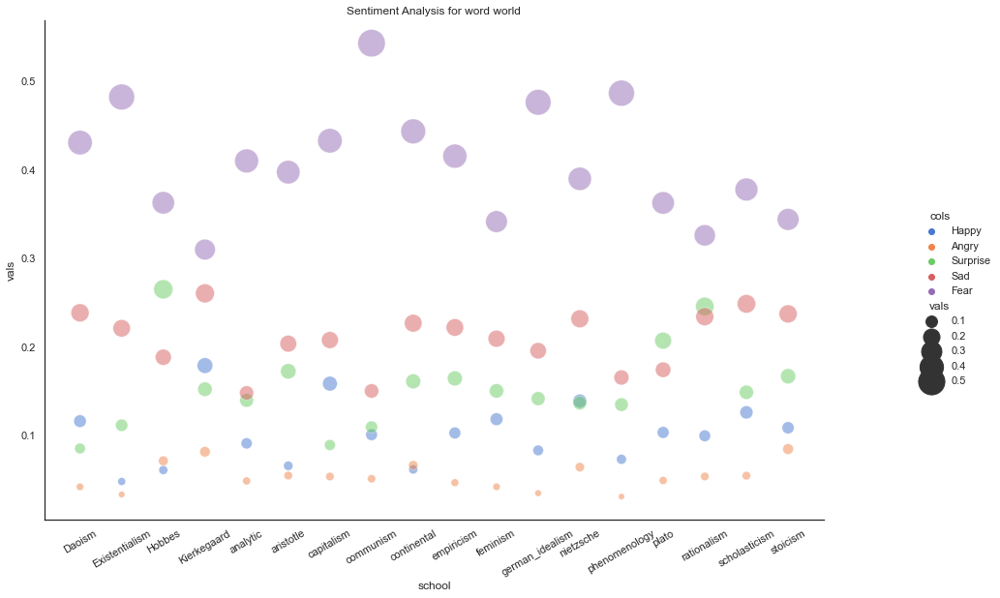

<Figure size 1080x576 with 0 Axes>

In [21]:
#wdataset_sentiment = dataset
dataset_sentiment = dataset.loc[:,['school','author','title','sentence_cleaned2']]
#choose the worlds to investigate
words_of_interest = ['god', 'labour','philosophy','woman','concept','think','idea','world']
for word in words_of_interest:
    #discard columns that are not needed
    dataset_sentiment = dataset.loc[:,['school','author','title','sentence_cleaned2']]
    #add a new column indicating if the word of interest exists in sentence
    dataset_sentiment['new'] = dataset_sentiment['sentence_cleaned2'].str.contains(word)
    data_of_interest =  dataset_sentiment[dataset_sentiment['new']== True ]
    #add a new column than contains  dictionnaries associating feelings to scores for each sentence
    data_of_interest['sentiment'] = data_of_interest['sentence_cleaned2'].apply(lambda s: te.get_emotion(s))
    #conver the dictionnary column to 5 separate ones, one for each feeling
    data_of_interest = pd.concat([data_of_interest.drop(['sentiment'], axis=1), data_of_interest['sentiment'].apply(pd.Series)], axis=1)
    #find the mean values for each school
    data2 = data_of_interest.loc[:,['Happy', 'Angry', 'Surprise', 'Sad', 'Fear' , 'school']]
    datamean2  = data2.groupby("school")['Happy', 'Angry', 'Surprise', 'Sad', 'Fear' ].mean()
    #visualization steps to get the following figures
    datamean2.reset_index(level=0, inplace=True)
    datamean2 = datamean2.melt('school', var_name='cols', value_name='vals')
    sns.set_theme(style="white") 
    g= sns.relplot(x="school", y="vals", hue="cols",
            sizes=(40, 800), alpha=.5, palette="muted", size = "vals",
            height=6, data=datamean2 , col_order=chronological_order,
)
    g.set_xticklabels(rotation=30)
    g.fig.set_size_inches(15,8)
    plt.title('Sentiment Analysis for word '+word)
    plt.show()
    plt.savefig(word+'_sentiment.png')

We proceed in making some observations related to the created plots.

The word god is for sure a powerfull word. The most common sentiment towards this topic is the one of surprise. This result is expected as philosophers challenge any non proven or weel specified belief. Moreover, philosophers and specifically Aristotle combine the word god with sentiments of fear. For the ancient greek philosopher this is more than expected. Finally, observe how the sentiments of Anger and Hapiness have very low scores. Philosophers tend to avoid extremes, talk about their beliefs but not with an overloaded excitement and certaincy for they know that they might be wrong. Finally not that the coloured dots are well alligned. That means that the sentiments of different schools towards this word follow a similar pattern.

Women is another topic that is being analyzed and we are surprised to see that the most associated sentiment is fear. Second in the row comes anger. Again the patterns of sentiment association seem to be stable for all the schools, but not as much as the patterns dictating sentiments towards god.

Surprise sentiments accompany the word think. Again, as in the case of word 'god', diffucult and non precise concepts are similarly percieved by most schools.

Perhaps surprisingly, the word work is also associated to fear in all schools. This is an interesting finding. One would imagine that for capitalism for example, sentences containing work would by associated to sentiments of happiness since work is viwed as the means for wealth and economic prosperity.

Fear, perhaps for the unknown, accompanies sentences including the word 'world'. The second most dominant sentiment is the one of sadness. For sure philosophers tend to contemplate about the difficulties and the malfunctions of societies a fact which is confirmed by the relevant plot.
Similar patterns as before, are present when the worlds concept and idea are being examined.
Finally, a general observation is that Hobbes, empiricism and stoicism, treat the concepts in the most sentiment-neutral way.  

# Conclusion

In this project we studied 18 schools of philosophy from a historical point of view. Although schools suceed one another, in terms of publication outputs, throughout the year, we discovered common naratives between schools. Specifically, schools seem to built up to previous ideas and, in combination to the current states of scocieties, evolve those into new ones and sometimes also introduce new concepts. We can think of this process as being parallel to human evolution. As philosophy describes people's state of minds, it is expected that philosophical ideas grow and progress as scocieties do. The correlations and common narratives that we identified in many schools indicate the importance of being familiar with a large amount of philosophical schools, for people we wish to gain a deeper understanding of the science of philosophy. Another interesting finding is that philosophers tend to approach topics without showing stong sentiments of happiness and anger, but in a rather neutral and, perhaps melancholic way. Until next blog post, stay safe!

# Remarks

Some potential issues that we would like to discuss are the following:

- The dataset contained a large amount of sentences, which in total represented only 69 books. For several schools we only had one reading from one author available and for no topic we had more than 11. For the schools of plato and aristotle this imbalance in author variety makes sense but for the rest of the schools it does not. A more accurate analysis would demand a larger collection of books from different authors.
- Sentiment analysis libraris do not take into consideration negative stop words such as 'not'. An exclusion of such words from english stop words and, a sentence by sentence inspection of their existence, could influence the sentiment assignment scores and could be worth examining.